## Custom CNN Model

This code defines a custom Convolutional Neural Network (CNN) model using Pytorch. The model is designed for traffic sign recognition, and it includes several convolutional layers, batch normalization, ReLU activation functions, maxpooling, and dropout layers to prevent overfitting. The model is built using the `nn.Module` class from Pytorch.

In [3]:
import torch 
import torch.nn as nn 
import os 

## Custom CNN Class

In [4]:
# class for Custom CNN 
class CustomCNN(nn.Module): 
    def __init__(self, input_channels=3, input_img_size=224, output_dims=[64, 128, 256, 512, 1024], num_classes=15): 
        super(CustomCNN, self).__init__()  
        
        # initialize the input parameter 
        input_ch = input_channels
        
        layers = []
        # Convolutional Layers
        # make a for loop here
        for output_ch in output_dims: 
            # 2 convolutional layers
            layers.append(nn.Conv2d(in_channels=input_ch, out_channels=output_ch, kernel_size=3, stride=1, padding=1)) 
            layers.append(nn.Conv2d(in_channels=output_ch, out_channels=output_ch, kernel_size=3, stride=1, padding=1)) 
            # BatchNorm2d 
            layers.append(nn.BatchNorm2d(output_ch)) 
            # ReLU 
            layers.append(nn.ReLU()) 
            # Maxpooling 
            layers.append(nn.MaxPool2d(kernel_size=2, stride=2)) 
            # update input channel for next layer 
            input_ch = output_ch 
        
        # Call sequential  
        self.hidden = nn.Sequential(*layers) 
        
        # MaxPooling reduces the input size of 224 (assume image size 224 x 224)
        # With 5 Maxpooling layers of stride 2 -> 224 / (2^5) = 7 
        img_size = input_img_size // (pow(2, len(output_dims)))  
        conv_output_size = output_dims[-1] * img_size * img_size 
        # Flatten 
        self.flatten = nn.Flatten() 
        
        # this dimension depends on the conv layers after flatten 
        mlp_out_dims = [4096, 2048, 1024, 512]
        mlp_layers = [] 
        
        # first layer: from conv output to first MLP layer 
        mlp_layers.append(nn.Linear(conv_output_size, mlp_out_dims[0])) 
        mlp_layers.append(nn.BatchNorm1d(mlp_out_dims[0]))
        mlp_layers.append(nn.ReLU()) 
        mlp_layers.append(nn.Dropout(0.2)) 
        # Intermediate layers 
        for i in range(len(mlp_out_dims) - 1): 
            mlp_layers.append(nn.Linear(mlp_out_dims[i], mlp_out_dims[i+1])) 
            mlp_layers.append(nn.BatchNorm1d(mlp_out_dims[i+1]))
            mlp_layers.append(nn.ReLU()) 
            mlp_layers.append(nn.Dropout(0.2)) 
        
        # Create mlp sequential block 
        self.fc_layers = nn.Sequential(*mlp_layers) 
        
        # Fully Connected to 15 classes output 
        self.last_fc = nn.Linear(in_features=mlp_out_dims[-1] , out_features=num_classes)
        
        # relu 
        self.relu = nn.ReLU()
        
    def forward(self, x): 
        # call sequential conv layers 
        x = self.hidden(x) 
        # call Fatten 
        x = self.flatten(x) 
        # call sequential mlp layers   
        x = self.fc_layers(x) 
        # call last fc layer
        x = self.last_fc(x) 
    
        return x 

In [56]:
from sklearn.metrics import f1_score

## Train and Evaluate Function

In [57]:
# train and eval functions
def train(model, train_data_loader, validate_data_loader, optimizer, criterion, scheduler, device, history, num_epochs=5, threshold=0.75):
    
    # early stopping
    best_val_loss = float('inf')
    epochs_no_improve = 0 
    best_model_state = None 
    
    # number of epochs 
    for epoch in range(num_epochs): 
        model.train() 

        train_loss = 0.0 
        train_correct = 0 
        total_train = 0
        
        # for f-1 score 
        all_preds = [] 
        all_targets = [] 
        
        # loop thru dataloader 
        for X, y in train_data_loader: 
            # change location of data 
            X, y = X.to(device), y.to(device).float() # y is float for BCEWithLogitsLoss 
            # initialize the gradient 
            optimizer.zero_grad() 
            # predict 
            output = model(X)  # logits 
            # get loss value  
            loss = criterion(output, y) 
            # y here is the problem 
            # be aware of dataset inconsistency
            # multi-label classification 
            # use BCELossLogits and sigmoid (multi-label classification) 
            
            # backprop 
            loss.backward() 
            
            # optimizer 
            optimizer.step() # update loss 
            
            # each batch 
            train_loss += loss.item() * X.size(0) 
            # print(f"Output: {output}") 
            # Compute multi-label prediction 
            predict = (torch.sigmoid(output) > threshold).float() 
            
            # accumulate predictions and targets for F-1 score
            all_preds.append(predict.detach().cpu()) 
            all_targets.append(y.detach().cpu()) 
            
            # exact match of accuracy 
            train_correct += (predict == y).all(dim=1).sum().item() 
            total_train += y.size(0) 
            
        # calculate correct prediction to accuracy
        train_acc = train_correct / total_train 
        train_loss /= total_train      
        
        # calculate F-1 score 
        all_preds = torch.cat(all_preds, dim=0).numpy() 
        all_targets = torch.cat(all_targets, dim=0).numpy() 
        train_f1 = f1_score(all_targets, all_preds, average='micro', zero_division=0) 
        
        # do validation dataloader loop 
        model.eval() 
        val_loss = 0.0 
        val_correct = 0 
        total_val = 0 
        
        # for F-1 score 
        val_preds = [] 
        val_targets = [] 
        
        with torch.no_grad(): 
            for X, y in validate_data_loader: 
                # change location of data 
                X, y = X.to(device), y.to(device).float()  
                
                # predict
                output = model(X) 
                # loss 
                loss = criterion(output, y) 
                # each batch 
                val_loss += loss.item() * X.size(0) 
                
                # Compute multi-label prediction 
                preds = (torch.sigmoid(output) > threshold).float() 
                
                # accumulate predictions and targets for F-1 score 
                val_preds.append(preds.detach().cpu()) 
                val_targets.append(y.detach().cpu()) 
                # exact match of accuracy 
                val_correct += (preds == y).all(dim=1).sum().item() 
                total_val += y.size(0)  
        
        # add avg loss and acc to the list         
        val_acc = val_correct / (total_val + 1e-8)
        val_loss /= (total_val + 1e-8)  
        
        # calculate F-1 score for validation 
        val_preds = torch.cat(val_preds, dim=0).numpy() 
        val_targets = torch.cat(val_targets, dim=0).numpy() 
        val_f1 = f1_score(val_targets, val_preds, average='micro', zero_division=0) 
        
        # keep track of validate loss because the mode is 'min'
        scheduler.step(val_loss) # Update LR  
                
        # append the loss and accuracy to the list 
        history['epoch'].append(epoch) 
        history['train_loss'].append(train_loss) 
        history['train_acc'].append(train_acc) 
        history['val_loss'].append(val_loss) 
        history['val_acc'].append(val_acc)
        
        history['train_f1'].append(train_f1) 
        history['val_f1'].append(val_f1) 
        
        print(f"Epoch {epoch+1:2d} | "
          f"train_loss={train_loss:.4f}, train_acc={train_acc:.4f}, train_f1={train_f1:.4f}| "
          f"val_loss={val_loss:.4f}, val_acc={val_acc:.4f}, val_f1={val_f1:.4f}")    

        # Early stopping check 
        if val_loss < best_val_loss - 1e-5: 
            best_val_loss = val_loss 
            epochs_no_improve = 0 
            best_model_state = model.state_dict() # save best model 
        else: 
            epochs_no_improve += 1 
            if epochs_no_improve >= 5: # patience = 5 
                print(f"Early stopping at epoch {epoch+1}. No Improvement for 5 consecutive epochs.")
                break 
    # load the model back if it break before the setted epochs 
    if best_model_state: 
        model.load_state_dict(best_model_state)         
        
    # return the list of loss and accuracy 
    return history 

# test function 
def eval(model, test_data_loader, criterion, device, threshold=0.75):
    
    # call model.eval() 
    model.eval() 
    
    test_loss = 0.0 
    test_correct = 0 
    total_test = 0 
        
    with torch.no_grad(): 
        # loop thru the test loader
        for X, y in test_data_loader: 
            # change location of data 
            X, y = X.to(device), y.to(device).float()  
            
            # predict
            output = model(X) 
            # loss 
            loss = criterion(output, y) 
            # each batch 
            test_loss += loss.item() * X.size(0) 
            
            # Compute multi-label prediction 
            preds = (torch.sigmoid(output) > threshold).float() 
            # exact match of accuracy 
            test_correct += (preds == y).all(dim=1).sum().item() 
            total_test += y.size(0)  
        
        # find avg loss and acc to the list         
        test_acc = test_correct / (total_test + 1e-8) 
        test_loss /= (total_test + 1e-8)  
    
    return test_acc, test_loss

In [58]:
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms.functional as TF
from PIL import Image
import matplotlib.pyplot as plt 

## Data Transformation

In [59]:
# define transforms 
# do data augmentation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((128, 128)),
        # transforms.Resize((64, 64)), 
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(20),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
]), 
    
    'eval': transforms.Compose([
        transforms.Resize((128, 128)), 
        # transforms.Resize((64, 64)), 
        transforms.ToTensor(), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])
}



## Generate Multi-Class Label

In [60]:
# Use class multi-label (since it is already splitted)
class MultiLabelYOLODataset(Dataset): 
    def __init__(self, image_dir, label_dir, transform=None, num_classes=15): 
        self.image_dir = image_dir
        self.label_dir = label_dir 
        self.transform = transform 
        self.num_classes = num_classes 
        
        # Collect image file paths 
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        # self.image_files.sort() # optional 
    
    def __len__(self): 
        return len(self.image_files) 
    
    def __getitem__(self, idx): 
        # image path 
        img_name = self.image_files[idx] 
        img_path = os.path.join(self.image_dir, img_name) 
        
        # open image 
        image = Image.open(img_path).convert('RGB')
        
        # label file path 
        label_path = os.path.join(self.label_dir, os.path.splitext(img_name)[0] + '.txt')
        
        # initialize multi-label vector 
        label = torch.zeros(self.num_classes) 
        
        # convert y to multi-label 
        # if txt file empty, then all zero torch 
        if os.path.exists(label_path): 
            with open(label_path, 'r') as f: 
                # parse the label information 
                # want to get all multi-label class
                # don't want to get bounding box 
                for line in f: 
                    # split all the tokens in txt 
                    tokens = line.strip().split() 
                    # if not tokens: 
                    #     continue 
                    # loop over tokens until reaching bbox  
                    for token in tokens: 
                        try: 
                            # parse a token of string to integer 
                            # if not float => raise error 
                            class_id = int(token)
                            if 0 <= class_id < self.num_classes: 
                                label[class_id] = 1 # set the class 
                        except ValueError:
                             # if reached bbox part
                            continue
        
        # Apply transforms
        if self.transform: 
            image = self.transform(image) 
        
        return image, label 
        

## Create Datasets

In [61]:
# create  datasets 
# data is already splitted 
data_path = 'traffic_sign_detection/car_resized' 
num_classes = 15 

train_dataset = MultiLabelYOLODataset(
    image_dir=os.path.join(data_path, 'train/images'),
    label_dir=os.path.join(data_path, 'train/labels'), 
    transform=data_transforms['train'],
    num_classes=num_classes
)

val_dataset = MultiLabelYOLODataset( 
    image_dir=os.path.join(data_path, 'valid/images'), 
    label_dir=os.path.join(data_path, 'valid/labels'), 
    transform=data_transforms['eval'], 
    num_classes=num_classes
)

test_dataset = MultiLabelYOLODataset(
    image_dir=os.path.join(data_path, 'test/images'),
    label_dir=os.path.join(data_path, 'test/labels'), 
    transform=data_transforms['eval'], 
    num_classes=num_classes
)

## Print and Display Image for Testing

Label at index 2430: tensor([1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.])


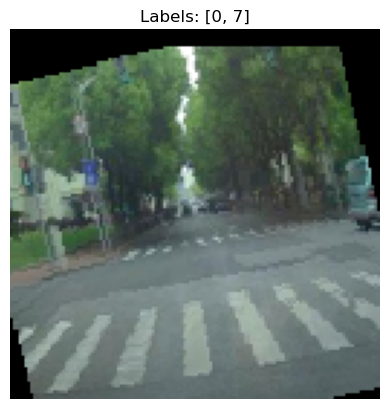

In [62]:
# for i in range(1,100, 5):
#     _, label = train_dataset.__getitem__(i) 
#     print(f"Label {i}: {label}")

img, label = train_dataset.__getitem__(2200)
print(f"Label at index 2430: {label}") 
# If the image is normalized, unnormalize it before display
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Unnormalize
img = TF.to_pil_image(img * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1))

# Show the image
plt.imshow(img)
plt.axis('off')
plt.title(f"Labels: {label.nonzero(as_tuple=True)[0].tolist()}")
plt.show()

Label 50: tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.])


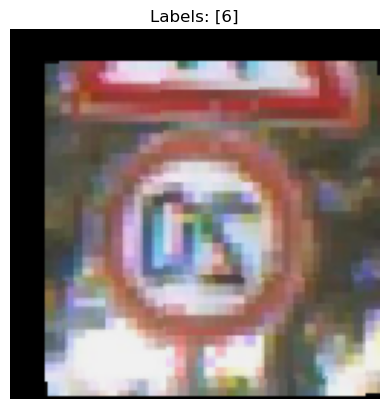

Label 60: tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.])


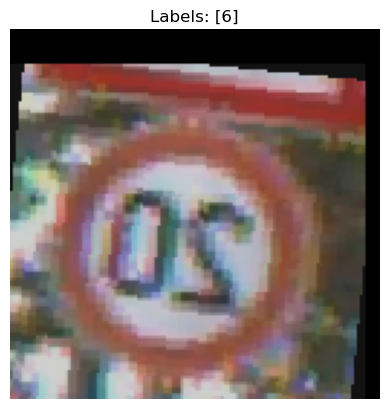

Label 70: tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.])


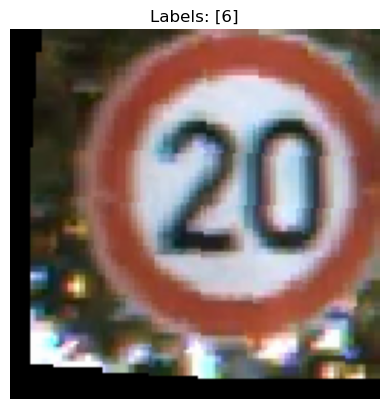

Label 80: tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.])


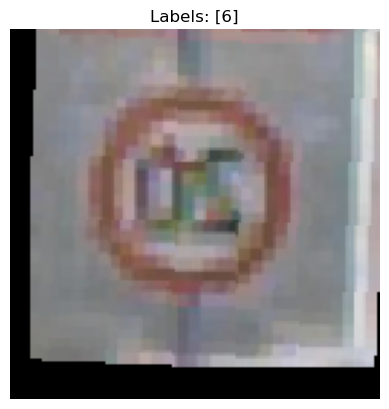

Label 90: tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.])


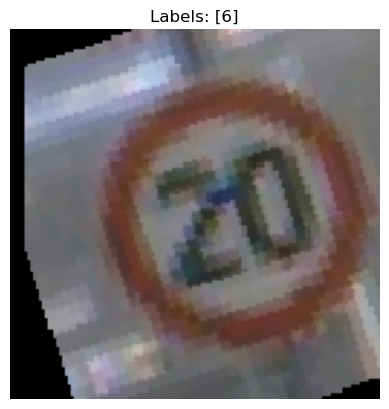

In [63]:
for i in range(50, 100, 10):
    img, label = train_dataset[i]
    print(f"Label {i}: {label}")
    # If the image is normalized, unnormalize it before display
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    # mean = [0.5, 0.5, 0.5]
    # std = [0.5, 0.5, 0.5]
    # Unnormalize
    img = TF.to_pil_image(img * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1))

    # Show the image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Labels: {label.nonzero(as_tuple=True)[0].tolist()}")
    plt.show()


## Verify of Data Leakage

In [64]:
# Verify if there are any leakage 

def list_image_filenames(dir_path):
    return set(os.path.splitext(f)[0] for f in os.listdir(dir_path) if f.endswith(('.jpg', '.jpeg', '.png')))

train_ids = list_image_filenames('traffic_sign_detection/car_resized/train/images')
val_ids = list_image_filenames('traffic_sign_detection/car_resized/valid/images')
test_ids = list_image_filenames('traffic_sign_detection/car_resized/test/images')

print("Train ∩ Val:", train_ids & val_ids)
print("Train ∩ Test:", train_ids & test_ids)
print("Val ∩ Test:", val_ids & test_ids)


Train ∩ Val: set()
Train ∩ Test: set()
Val ∩ Test: set()


## Batch the DataLoader

In [65]:
# DataLoader 
batch_size = 64 

# batch the train
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) 
# batch the valid 
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)  
# batch the test
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False) 

# print each datasets
print(f"# of train dataset: {len(train_dataset)}")
print(f"# of validate dataset: {len(val_dataset)}")
print(f"# of test dataset: {len(test_dataset)}")

# print(f'Classes: {train_dataset.classes}')
print(f'# of train batch: {len(train_loader)}')
print(f'# of val batch: {len(val_loader)}')
print(f'# of test batch: {len(test_loader)}')

# of train dataset: 3530
# of validate dataset: 801
# of test dataset: 638
# of train batch: 56
# of val batch: 13
# of test batch: 10


In [66]:
from torchinfo import summary 

## Display Architecture

In [ ]:
# Print trainable params
input_channels = 3
output_dims = [64, 128, 256, 512]
# output_dims = [64, 128, 256, 512, 1024, 2048]
num_classes = 15
# model = CustomCNN(input_channels=input_channels, input_img_size=64, output_dims=output_dims, num_classes=num_classes)

model = CustomCNN(input_channels=input_channels, input_img_size=128, output_dims=output_dims, num_classes=num_classes)

# model architecture
print(model)

CustomCNN(
  (hidden): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU()
    (14): MaxPool2d(

## Print and Save Model Information

In [68]:
# input_size=(1, 3, 224, 224)
# input_size=(1, 3, 64, 64)
input_size=(1, 3, 128, 128)
model_info = summary(model, input_size=input_size) 

print(model_info)

# Save to text file 
with open('model_summary.txt', 'w') as f: 
    f.write(str(model_info))

print(f"Saved model_info as txt file")

Layer (type:depth-idx)                   Output Shape              Param #
CustomCNN                                [1, 15]                   --
├─Sequential: 1-1                        [1, 512, 8, 8]            --
│    └─Conv2d: 2-1                       [1, 64, 128, 128]         1,792
│    └─Conv2d: 2-2                       [1, 64, 128, 128]         36,928
│    └─BatchNorm2d: 2-3                  [1, 64, 128, 128]         128
│    └─ReLU: 2-4                         [1, 64, 128, 128]         --
│    └─MaxPool2d: 2-5                    [1, 64, 64, 64]           --
│    └─Conv2d: 2-6                       [1, 128, 64, 64]          73,856
│    └─Conv2d: 2-7                       [1, 128, 64, 64]          147,584
│    └─BatchNorm2d: 2-8                  [1, 128, 64, 64]          256
│    └─ReLU: 2-9                         [1, 128, 64, 64]          --
│    └─MaxPool2d: 2-10                   [1, 128, 32, 32]          --
│    └─Conv2d: 2-11                      [1, 256, 32, 32]          

## Count Parameters

In [69]:
def count_model_params(model): 
    total = sum(p.numel() for p in model.parameters()) 
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad) 
    non_trainable = total - trainable 
    
    return total, trainable, non_trainable 

total, trainable, non_trainable = count_model_params(model) 
print(f"Total params: {total:,}")
print(f"Trainable params: {trainable:,}")
print(f"Non-trainable params: {non_trainable:,}") 

Total params: 149,945,807
Trainable params: 149,945,807
Non-trainable params: 0


## Create Hyperparameters

In [ ]:
# Model 
input_channels = 3
# output_dims = [64, 128, 256, 512, 1024, 2048]
num_classes = 15


In [72]:
# Hyperparameters 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device) 
# Loss and Optimizer 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)  
criterion = nn.BCEWithLogitsLoss() 
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

## Train the Model

In [73]:
# Call train and eval 
num_epochs = 100
history = {'epoch':[], 'train_loss':[], 'train_acc':[], 'train_f1': [], 'val_loss':[], 'val_acc':[], 'val_f1': []}

history = train(model, 
      train_data_loader=train_loader, 
      validate_data_loader=val_loader, 
      optimizer=optimizer,
      criterion=criterion, 
      scheduler=scheduler,
      device=device, 
      history=history,
      num_epochs=num_epochs,
      threshold=0.5) 
    

Epoch  1 | train_loss=0.4938, train_acc=0.0793, train_f1=0.2115| val_loss=0.3500, val_acc=0.1785, val_f1=0.3083
Epoch  2 | train_loss=0.2976, train_acc=0.1224, train_f1=0.2207| val_loss=0.2543, val_acc=0.1536, val_f1=0.2618
Epoch  3 | train_loss=0.2353, train_acc=0.1411, train_f1=0.2292| val_loss=0.2172, val_acc=0.1723, val_f1=0.3057
Epoch  4 | train_loss=0.2132, train_acc=0.1535, train_f1=0.2547| val_loss=0.1925, val_acc=0.2260, val_f1=0.3454
Epoch  5 | train_loss=0.1995, train_acc=0.1686, train_f1=0.2847| val_loss=0.1844, val_acc=0.2322, val_f1=0.3861
Epoch  6 | train_loss=0.1905, train_acc=0.1943, train_f1=0.3210| val_loss=0.1773, val_acc=0.2185, val_f1=0.3603
Epoch  7 | train_loss=0.1827, train_acc=0.2000, train_f1=0.3326| val_loss=0.1702, val_acc=0.2572, val_f1=0.4263
Epoch  8 | train_loss=0.1778, train_acc=0.2221, train_f1=0.3644| val_loss=0.1709, val_acc=0.2672, val_f1=0.4396
Epoch  9 | train_loss=0.1733, train_acc=0.2326, train_f1=0.3766| val_loss=0.1669, val_acc=0.3034, val_f1

## Test the Model

In [74]:
test_acc, test_loss = eval(model, 
                           test_data_loader=test_loader, 
                           criterion=criterion, 
                           device=device, 
                           threshold=0.5)  
print(f"Test accuracy: {test_acc:.4f}")
print(f"Test loss: {test_loss:.4f}")

Test accuracy: 0.7320
Test loss: 0.0792


In [75]:
# Plot evaluation here 
# Loss and Accuracy Curve (Train and Validate) 
import matplotlib.pyplot as plt 

def plot_loss_accuracy(history): 
    """
    Plots training and validation loss and accuracy curves
    
    """
    
    epochs = history['epoch'] 
    
    plt.figure(figsize=(12,5))
    
    plt.suptitle("Customed CNN Model")
    
    # Loss Curve 
    plt.subplot(1, 2, 1) 
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Val Loss')
    plt.title("Loss Curve")
    plt.xlabel("Epoch") 
    plt.ylabel("Loss")
    plt.legend() 
    plt.grid(True) 
    
    # Accuracy Curve 
    plt.subplot(1, 2, 2) 
    plt.plot(epochs, history['train_acc'], label='Train Accuracy')
    plt.plot(epochs, history['val_acc'], label='Val Accuracy')
    plt.title("Accuracy Curve")
    plt.xlabel("Epoch") 
    plt.ylabel("Accuracy")
    plt.legend() 
    plt.grid(True) 
    
    plt.tight_layout() 
    plt.show() 
    

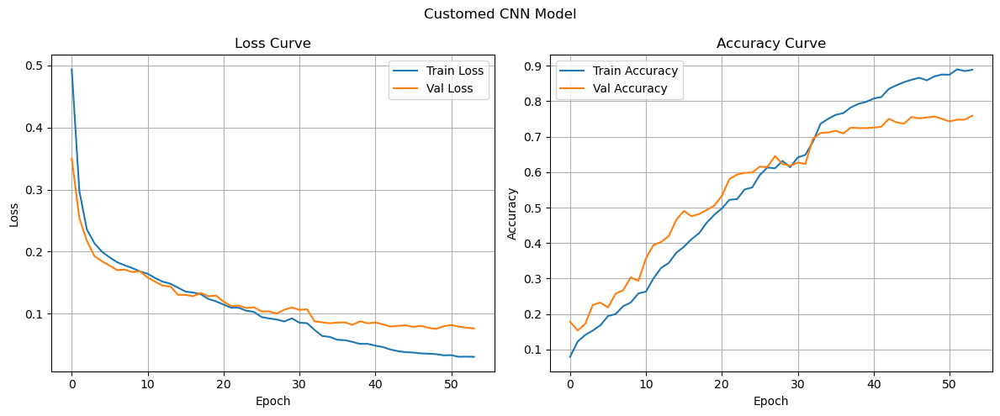

In [76]:
# Call Plot 
plot_loss_accuracy(history) 

Macro F1-score:     0.8119
Macro Precision:    0.8833
Macro Recall:       0.7615


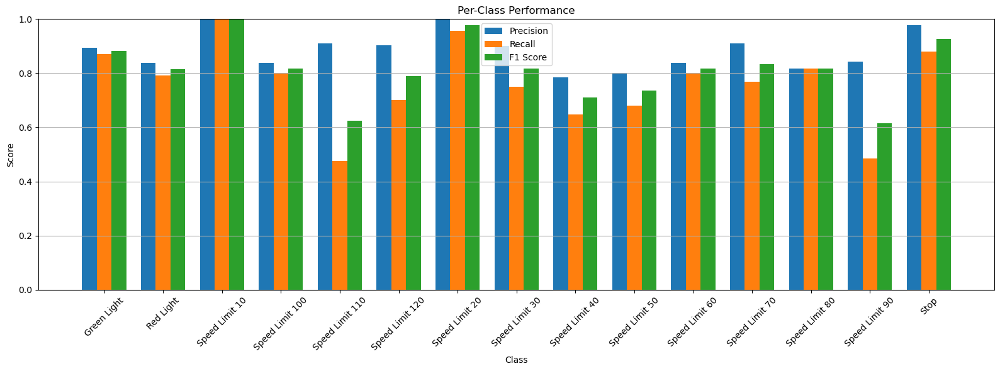

In [77]:
# Plot F-1 Score to see the test accuracy
# Precision and Recall  
from sklearn.metrics import f1_score, precision_score, recall_score 
import numpy as np 

# Setup 
model.eval() 
all_preds = []
all_targets = [] 
threshold = 0.5 

with torch.no_grad(): 
    for X, y in test_loader: 
        X = X.to(device) 
        y = y.to(device).float() 
        
        logits = model(X) 
        probs = torch.sigmoid(logits) 
        preds = (probs > threshold).float()
        
        all_preds.append(preds.cpu())
        all_targets.append(y.cpu())

# Stack all batches 
y_pred  = torch.cat(all_preds).numpy() 
y_true = torch.cat(all_targets).numpy() 
        
# Compute metrics
f1 = f1_score(y_true, y_pred, average='macro', zero_division=0) 
precision = precision_score(y_true, y_pred, average='macro', zero_division=0) 
recall = recall_score(y_true, y_pred, average='macro', zero_division=0)

# Print results
print(f"Macro F1-score:     {f1:.4f}")
print(f"Macro Precision:    {precision:.4f}")
print(f"Macro Recall:       {recall:.4f}")

# Compute metrics per-class
f1_per_class = f1_score(y_true, y_pred, average=None, zero_division=0) 
precision_per_class = precision_score(y_true, y_pred, average=None, zero_division=0) 
recall_per_class = recall_score(y_true, y_pred, average=None, zero_division=0)

class_names = ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 
                  'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 
                  'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 
                  'Speed Limit 80', 'Speed Limit 90', 'Stop']
# class_names = [f"Class {name}" for i, name in enumerate(num_classes)]

# Plot
x = np.arange(num_classes)
bar_width = 0.25

plt.figure(figsize=(16, 6))
plt.bar(x - bar_width, precision_per_class, width=bar_width, label='Precision')
plt.bar(x, recall_per_class, width=bar_width, label='Recall')
plt.bar(x + bar_width, f1_per_class, width=bar_width, label='F1 Score')

plt.xticks(x, class_names, rotation=45)
plt.xlabel("Class")
plt.ylabel("Score")
plt.title("Per-Class Performance") 
plt.ylim(0, 1.0)
plt.legend()
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

## Save the Model for deployment

In [78]:
# Save model's weight for deployment 
torch.save(model.state_dict(), 'custom_cnn.pt')

## Load the Model 

In [5]:
load_model = CustomCNN(input_img_size=128, output_dims=[64, 128, 256, 512])
load_model.load_state_dict(torch.load('custom_cnn.pt', map_location='cuda')) 

load_model.eval() 

C:\Users\chamr\AppData\Local\Temp\ipykernel_24912\4068251204.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  load_model.load_state_dict(torch.load('custom_cnn.pt', map_l

CustomCNN(
  (hidden): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU()
    (14): MaxPool2d(

In [51]:
import random  
random.seed(42)
# Read ground truth label for comparison
def read_label_file(label_path, num_classes=15):
    ground_truth = np.zeros(num_classes)
    
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                tokens = line.strip().split()
                if not tokens:
                    continue
                try:
                    class_id = int(tokens[0])
                    if 0 <= class_id < num_classes:
                        ground_truth[class_id] = 1
                except ValueError:
                    continue
    
    return ground_truth

# Prediction function with ground truth comparison
def predict_image_with_ground_truth(model, image_path, label_path, transform, threshold=0.5, num_classes=15):
    # Load and predict image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    
    with torch.no_grad():
        outputs = model(image_tensor)
        probs = torch.sigmoid(outputs)
        preds = (probs > threshold).float().squeeze().numpy()
    
    # Read ground truth label
    ground_truth = read_label_file(label_path, num_classes)
    
    return image, preds, probs.squeeze().numpy(), ground_truth

# Visualize prediction results with ground truth comparison
def visualize_prediction_with_ground_truth(image, preds, probs, ground_truth, class_names, threshold=0.5):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
    
    # Display original image
    ax1.imshow(image)
    ax1.set_title("Original Image")
    ax1.axis('off')
    
    # Display prediction probability bar chart
    y_pos = np.arange(len(class_names))
    
    # Simple color scheme: predicted classes are green, others are grey
    colors = ['green' if p > threshold else 'grey' for p in probs]
    
    # Plot bars
    ax2.barh(y_pos, probs, color=colors)
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(class_names)
    ax2.set_xlabel('Probability')
    ax2.set_title('Predicted Classes (Green) vs Ground Truth (★)')
    
    # Add probability value labels and mark ground truth with stars
    for i, prob in enumerate(probs):
        # Mark ground truth with a star
        if ground_truth[i] == 1:
            label = f"★ {prob:.2f}"
        else:
            label = f"{prob:.2f}"
        
        ax2.text(prob + 0.01, i, label, va='center')
    
    # Add prediction result text and ground truth text
    detected_classes = [class_names[i] for i in range(len(class_names)) if preds[i] == 1]
    ground_truth_classes = [class_names[i] for i in range(len(class_names)) if ground_truth[i] == 1]
    
    if detected_classes:
        detected_text = "Predicted: " + ", ".join(detected_classes)
    else:
        detected_text = "No Traffic Signs Predicted"
        
    if ground_truth_classes:
        gt_text = "Ground Truth: " + ", ".join(ground_truth_classes)
    else:
        gt_text = "No Traffic Signs in Ground Truth"
    
    plt.figtext(0.5, 0.08, detected_text, ha="center", fontsize=12, 
                bbox={"facecolor":"lightskyblue", "alpha":0.2, "pad":5})
    plt.figtext(0.5, 0.03, gt_text, ha="center", fontsize=12, 
                bbox={"facecolor":"lightgreen", "alpha":0.2, "pad":5})
    
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)  # Leave space for bottom text
    plt.show()

# Find multi-label images
def find_multi_label_images(image_dir, label_dir, num_samples=5):
    multi_label_images = []
    
    for img_file in os.listdir(image_dir):
        if not img_file.endswith('.jpg'):
            continue
            
        label_file = os.path.join(label_dir, img_file.replace('.jpg', '.txt'))
        
        if os.path.exists(label_file):
            with open(label_file, 'r') as f:
                lines = f.readlines()
                # If there are multiple label lines, it's a multi-label image
                if len(lines) > 1:
                    multi_label_images.append((
                        os.path.join(image_dir, img_file),
                        label_file
                    ))
    
    # Randomly select specified number of multi-label images
    if len(multi_label_images) > num_samples:
        return random.sample(multi_label_images, num_samples)
    return multi_label_images

# Function to test multi-label images with ground truth comparison
def test_multilabel_images(model, test_image_dir, test_label_dir, class_names):
    # Get multi-label images
    multi_label_images = find_multi_label_images(test_image_dir, test_label_dir)
    
    if not multi_label_images:
        print("No multi-label images found!")
        return
    
    print(f"Found {len(multi_label_images)} multi-label images")
    
    # Test different thresholds
    thresholds = [0.3, 0.4, 0.5, 0.6]
    
    # Process each image
    for image_path, label_path in multi_label_images:
        print(f"\nPredicting image: {os.path.basename(image_path)}")
        
        for threshold in thresholds:
            print(f"\nUsing threshold: {threshold}")
            image, preds, probs, ground_truth = predict_image_with_ground_truth(
                model, image_path, label_path, data_transforms['eval'], threshold)
            
            # Visualize
            visualize_prediction_with_ground_truth(
                image, preds, probs, ground_truth, class_names, threshold)



C:\Users\chamr\AppData\Local\Temp\ipykernel_36112\1419716287.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  load_model.load_state_dict(torch.load('custom_cnn.pt', map_


Testing Custom CNN model on multi-label images...
Found 5 multi-label images

Predicting image: road639_png.rf.74306332af06fee257b44f5dd9ae02fb.jpg

Using threshold: 0.3


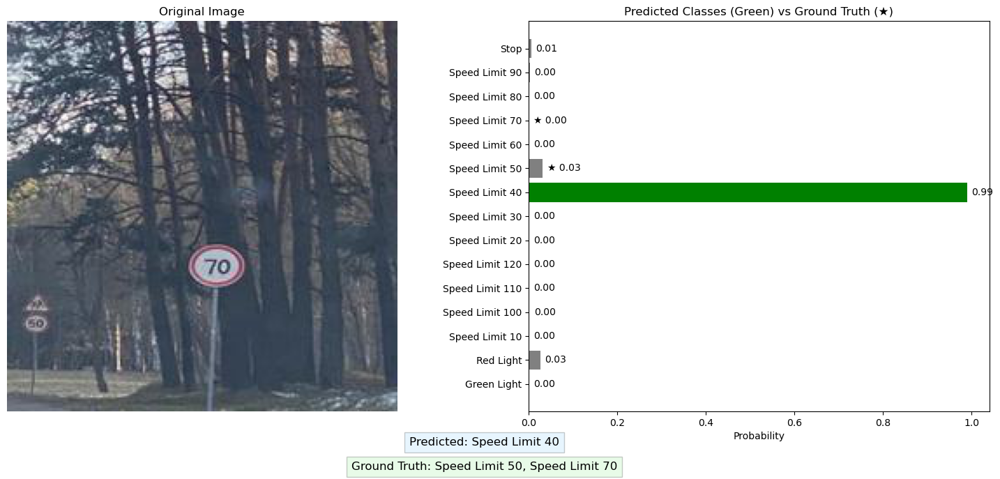


Using threshold: 0.4


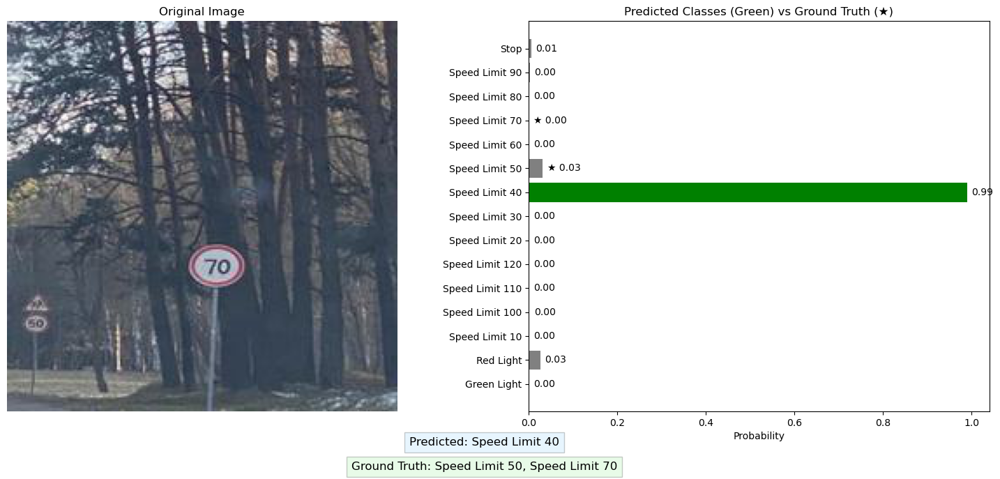


Using threshold: 0.5


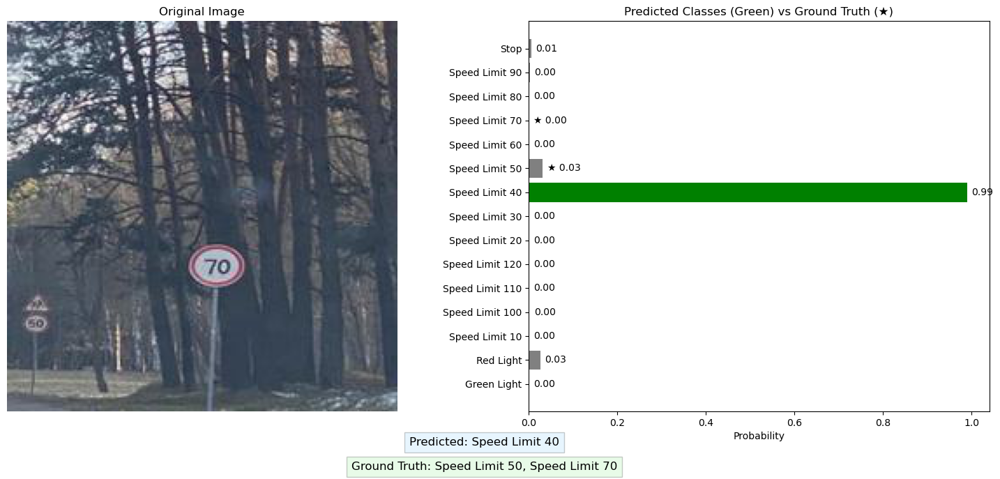


Using threshold: 0.6


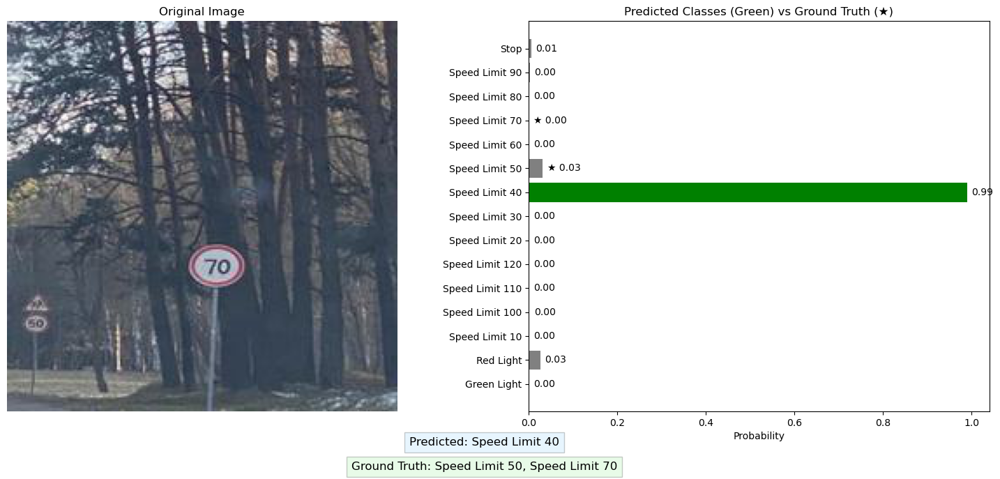


Predicting image: 000934_JPG_jpg.rf.81031f117e2b4ac8b19c0cbe3bdd1d99.jpg

Using threshold: 0.3


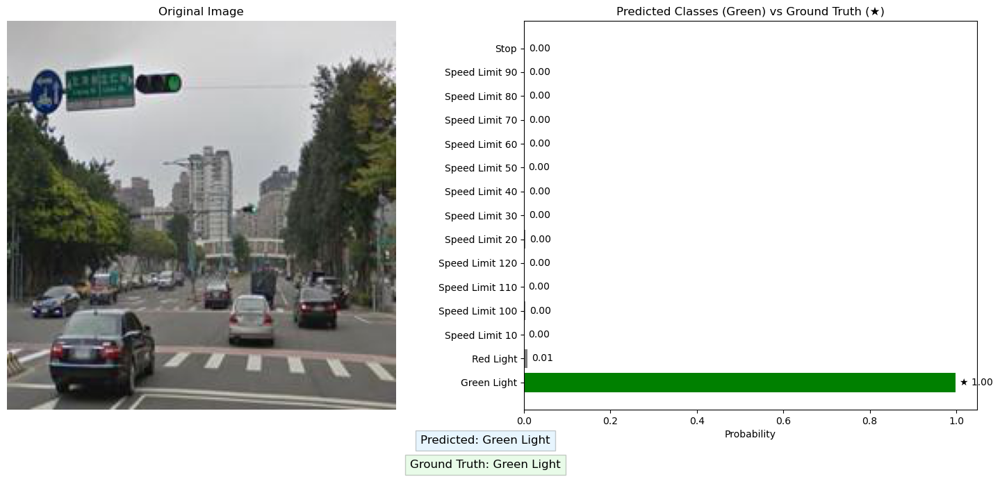


Using threshold: 0.4


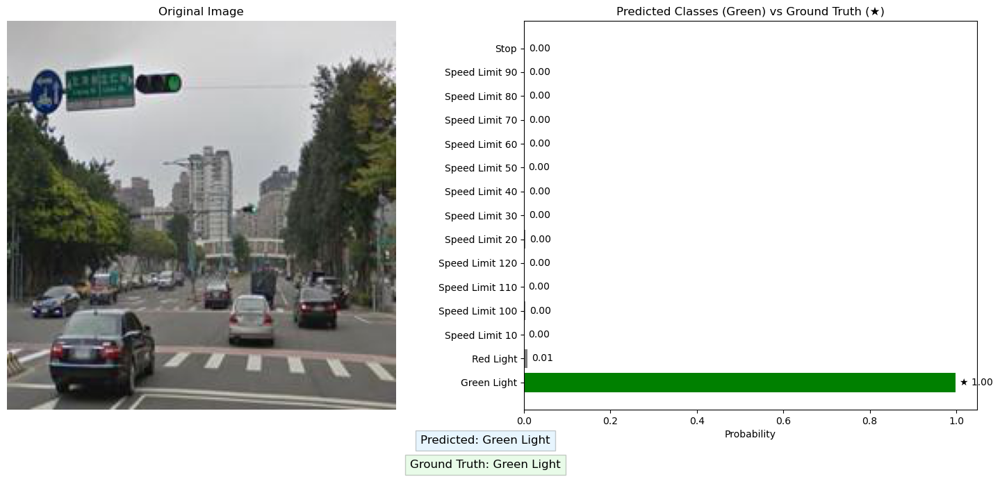


Using threshold: 0.5


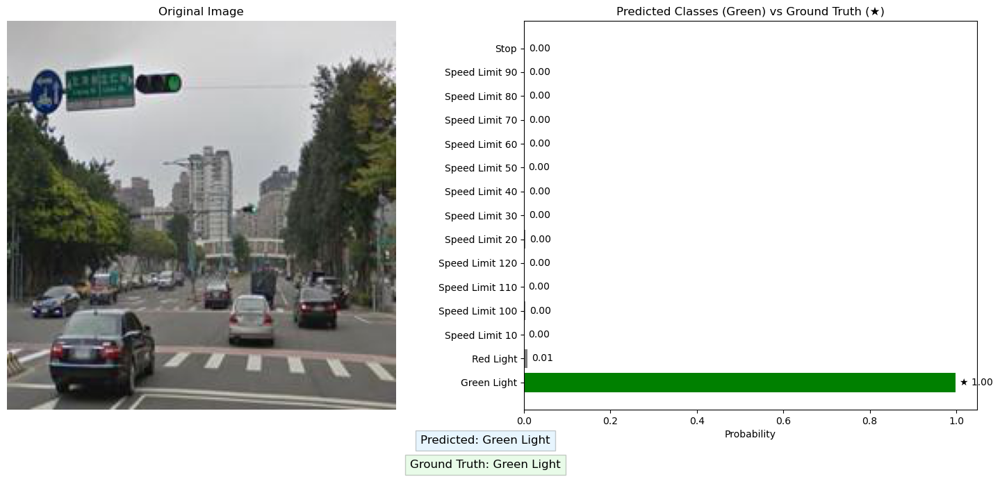


Using threshold: 0.6


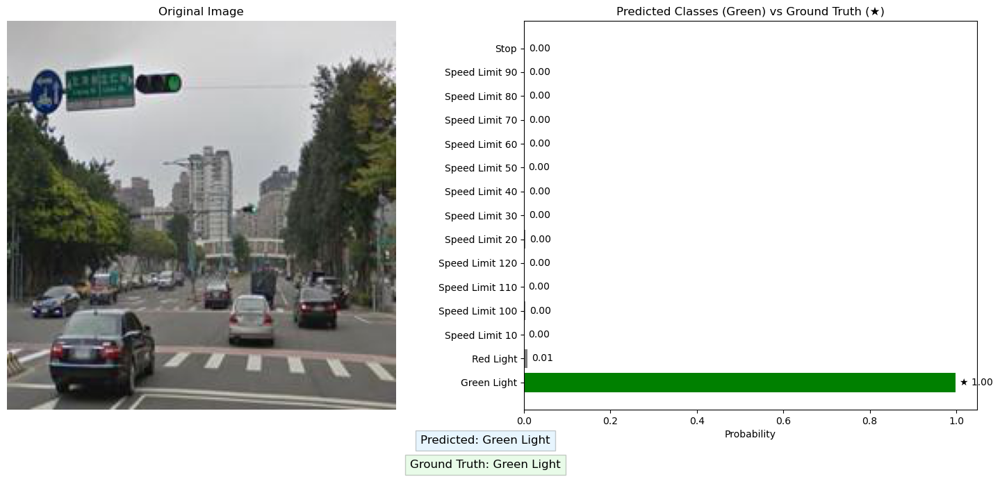


Predicting image: 000684_jpg.rf.da8d58e5754b48f640c2521ce190912e.jpg

Using threshold: 0.3


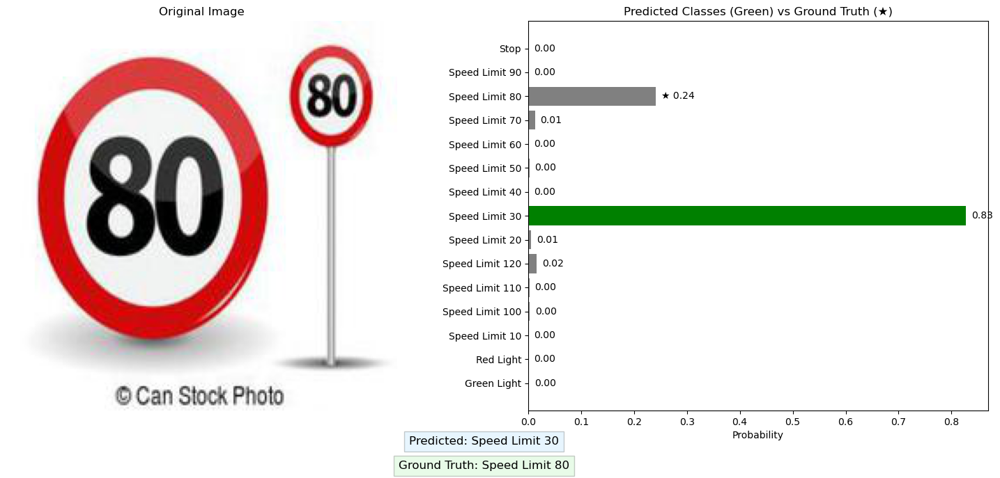


Using threshold: 0.4


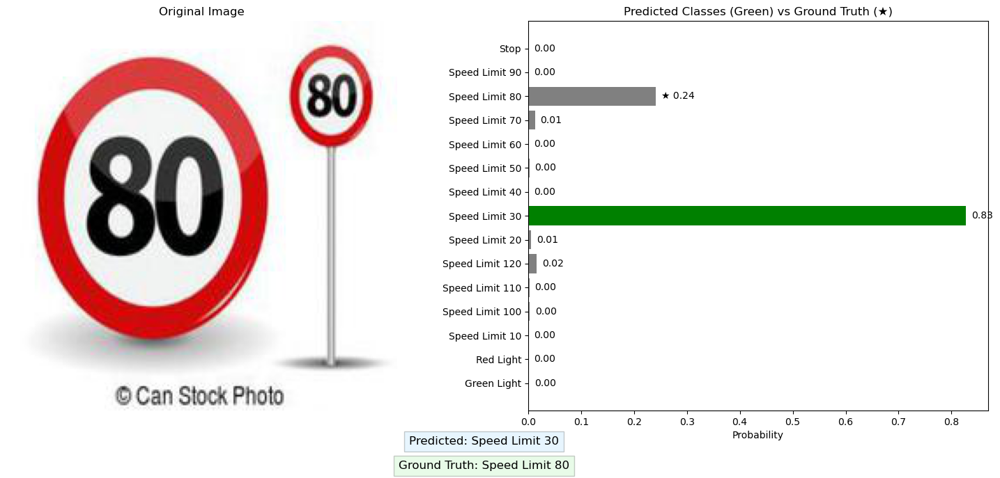


Using threshold: 0.5


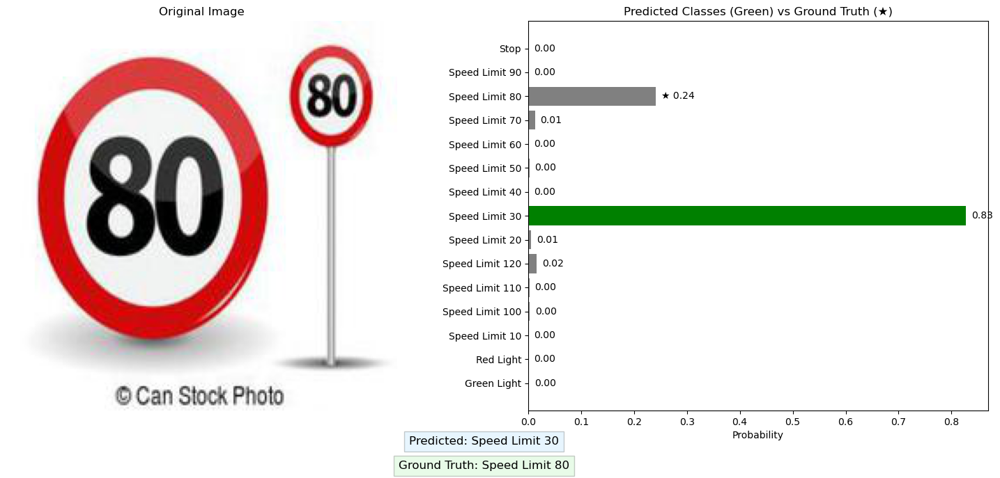


Using threshold: 0.6


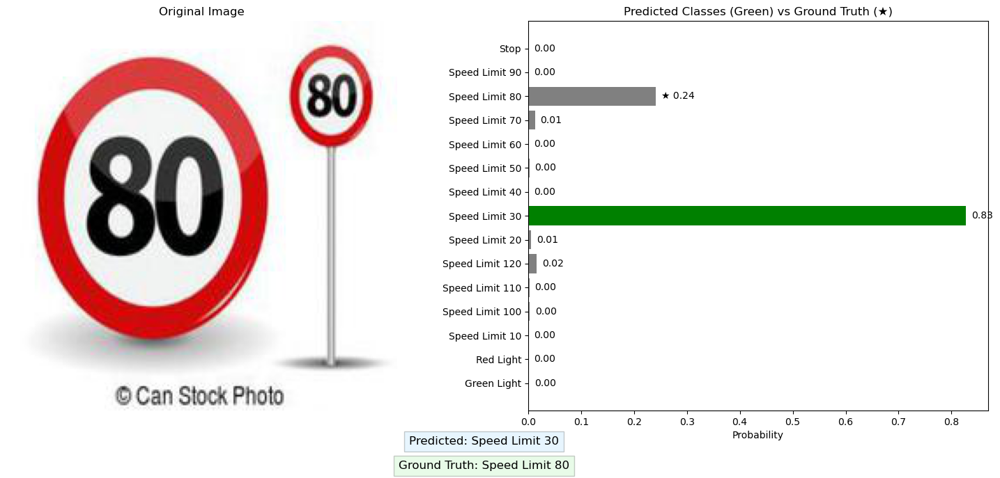


Predicting image: road747_png.rf.66031af78137deac5c6878292d9ce7db.jpg

Using threshold: 0.3


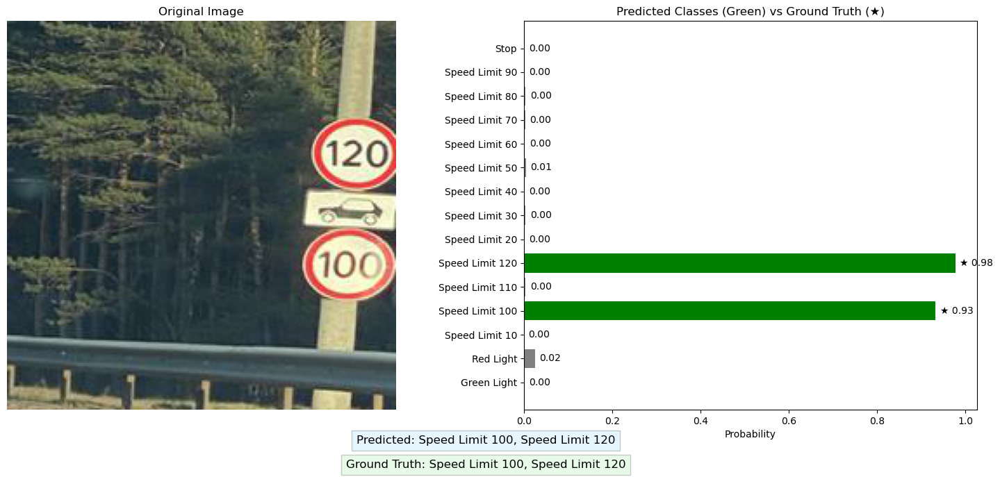


Using threshold: 0.4


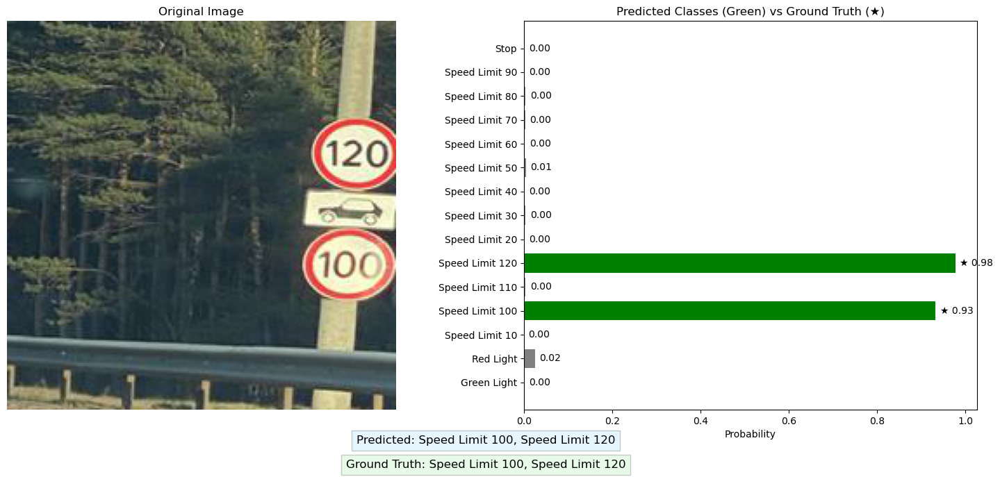


Using threshold: 0.5


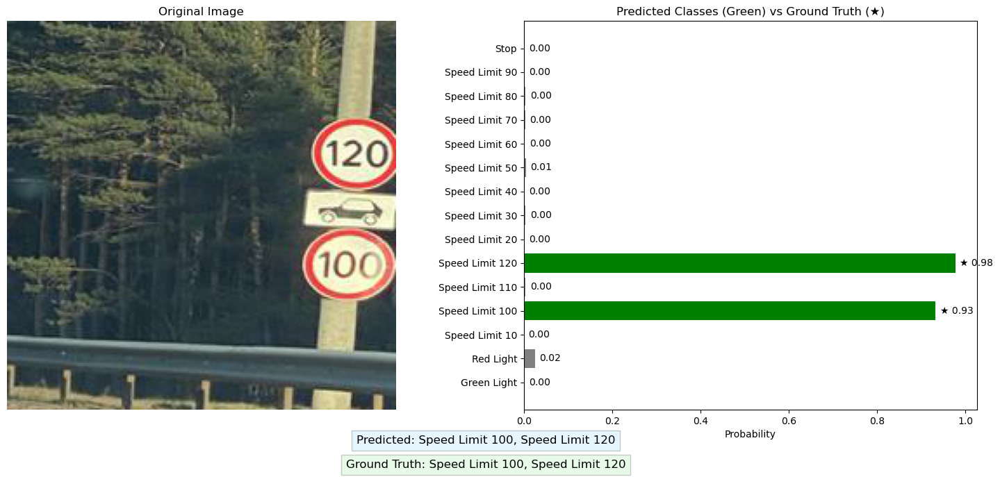


Using threshold: 0.6


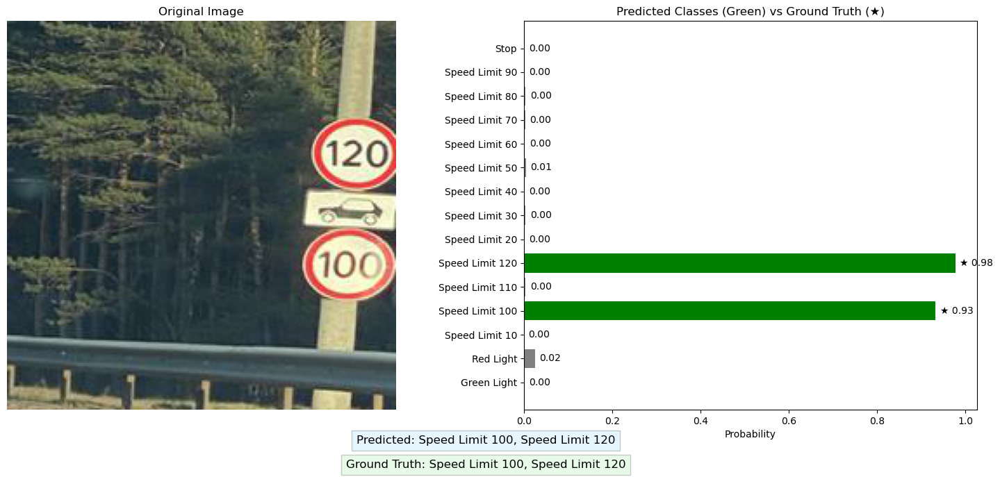


Predicting image: 001826_JPG_jpg.rf.a805482f1c979ccfd35e378a2d5d78a6.jpg

Using threshold: 0.3


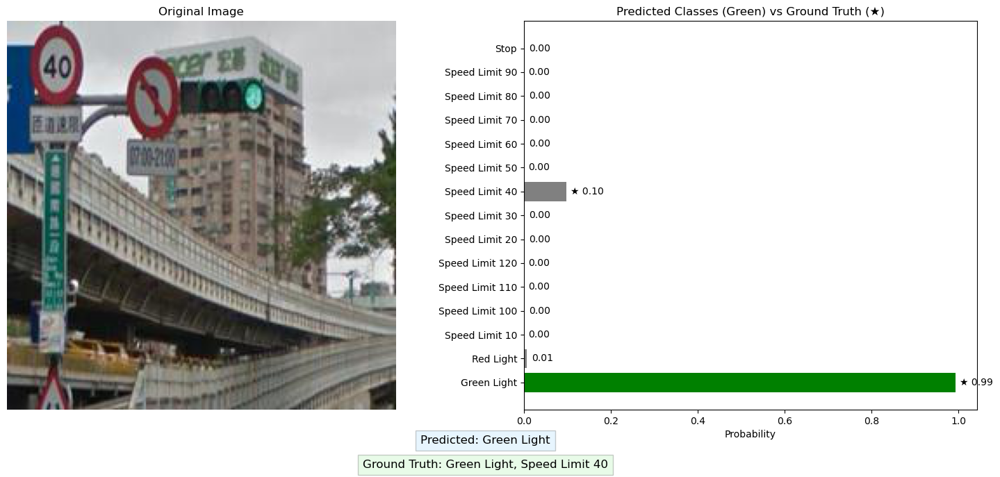


Using threshold: 0.4


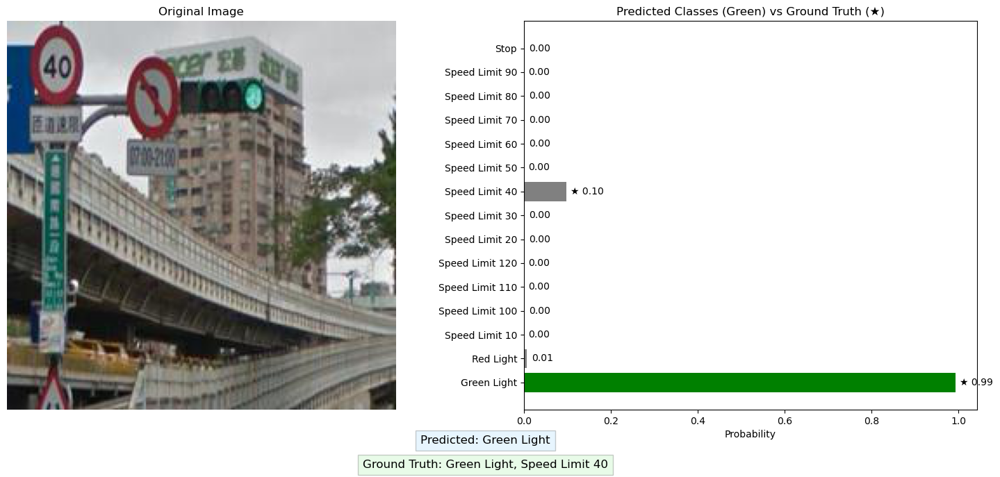


Using threshold: 0.5


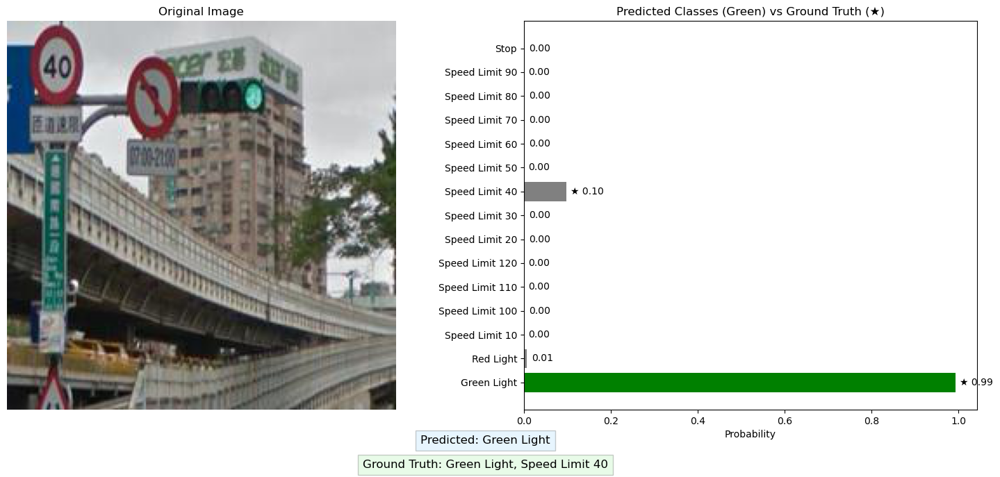


Using threshold: 0.6


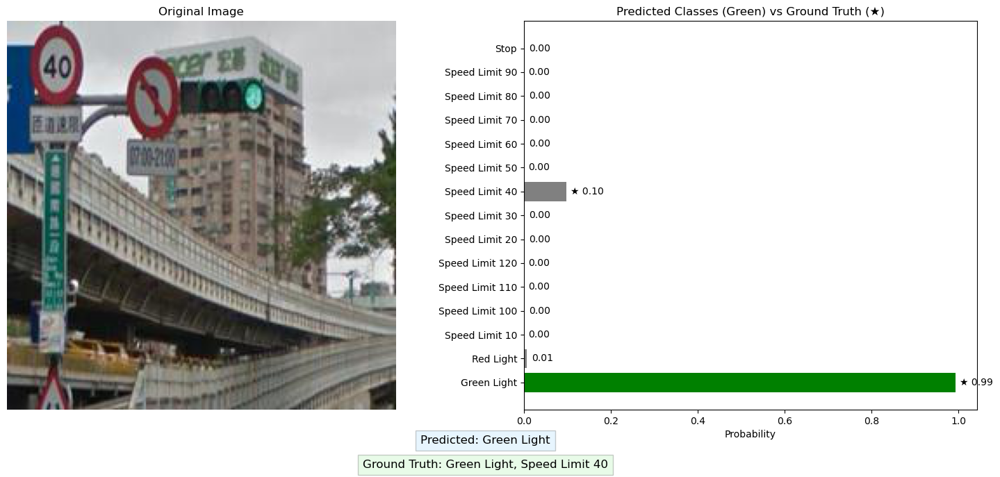

Done!


In [52]:
# Data path
data_path = "traffic_sign_detection/car_resized"
test_image_dir = os.path.join(data_path, "test", "images")
test_label_dir = os.path.join(data_path, "test", "labels")
    
# Class names
class_names = [
    'Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 
    'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 
    'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 
    'Speed Limit 80', 'Speed Limit 90', 'Stop'
]

# Load model 
load_model = CustomCNN(input_img_size=128, output_dims=[64, 128, 256, 512])
load_model.load_state_dict(torch.load('custom_cnn.pt', map_location='cuda')) 

load_model.eval() 

# Classification threshold
threshold = 0.5
    
print("\nTesting Custom CNN model on multi-label images...")
test_multilabel_images(load_model, test_image_dir, test_label_dir, class_names)

print("Done!")

## Configure the Transformation

In [6]:
import cv2 
import torch 
import torchvision.transforms as transforms 
from PIL import Image 


In [7]:
cls_names = ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop']

# match training 
transformation = transforms.Compose([
        transforms.Resize((128, 128)),
        # transforms.Resize((64, 64)), 
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(20),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
]) 

## Video Input

In [10]:
# open video 
cap = cv2.VideoCapture('traffic_sign_detection/video.mp4')  
# cap = cv2.VideoCapture('1001_0/1001/0178c90ed6b0738c9e18de3816e61b55.mp4') 

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
load_model = load_model.to(device)

# Define codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # or use 'XVID' for .avi
output_path = 'traffic_sign_detection/output_annotated.mp4'

# Get frame width and height
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))


while True: 
    ret, frame = cap.read() 
    if not ret: 
        break 

    
    # Convert to PIL image 
    image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) 
    input_tensor = transformation(image).unsqueeze(0).to(device) 
    
    # Run inference 
    with torch.no_grad(): 
        outputs = load_model(input_tensor) 
        _, predicted = torch.max(outputs, 1) 
        label = cls_names[predicted.item()]
        
    # Overlay label on frame 
    cv2.putText(frame, f"Prediction: {label}", (5, 20), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1) 

    out.write(frame)  # write annotated frame to output video

    cv2.imshow("Traffic Sign Classification", frame) 
    # change speed here
    fps = cap.get(cv2.CAP_PROP_FPS) 
    delay = int(1000 / fps) # convert to milliseconds 
      
    if cv2.waitKey(delay) & 0xFF == ord('q'): 
        break 

cap.release() 
out.release()
cv2.destroyAllWindows() 